Currently, my code for calculating ICL as in ```measure_icl_v0.ipynb``` gives completely different results to what would be expected from the paper https://ui.adsabs.harvard.edu/abs/2021MNRAS.502.2419F/abstract, misordering the clusters. Need to figure out why this occurs and how to fix it. 

Expected results
| Lit ID | ICL frac (%) | My ID |
| ------ | -------- | ----- |
| 12 | 38.43 | 18 |
| 15 | 32.76 | 17 |
| 17 | 27.62 | 14 |
| 4 | 27.57 | 2317 |
| 6 | 26.76 | 39 |
| 13 | 23.85 | 45 |
| 16 | 19.85 | 967 |
| 5 | 15.40 | 73 |

### Thresholding issues
My threshold looks way less aggressive than it should be - probably an issue with the calculation somewhere.

In [1]:
# Load the cutouts
import h5py
from astropy.io import ascii
from astropy.cosmology import FlatLambdaCDM
import numpy as np
import matplotlib.pyplot as plt

cutouts = h5py.File('../processed/cutouts.hdf')
tbl = ascii.read('../processed/camira_final.tbl')
zs = tbl['z_cl']
cosmo = FlatLambdaCDM(H0=68.4, Om0=0.301)

In [2]:
# Convenience function for plotting the images
stddev = 0.017359
def stretch(img):
    return np.arcsinh(np.clip(img, a_min=0.0, a_max=10.0) / stddev)

In [3]:
from photutils.background import Background2D
from scipy.interpolate import CloughTocher2DInterpolator

def background_estimate(cutout, mask=None):
    """
    Returns an estimate of the 2D background of `cutout`. The background is 
    measured in boxes of size 50px around the edges of the image, and the
    background is interpolated over the entire image. 
    """
    # Run photutil's Background2D for the low resolution grid
    bkg_initial = Background2D(cutout, box_size=50, mask=mask)
    mesh = bkg_initial.background_mesh
    
    # Extract just the edges of the mesh
    size_x = mesh.shape[0]
    size_y = mesh.shape[1]
    xvals = np.arange(0, size_x)
    yvals = np.arange(0, size_y)

    box_size = 50
    box_cen = (box_size - 1) / 2.0

    top = np.column_stack((xvals, (size_x - 1) * np.ones(size_x, dtype=int)))
    bottom = np.column_stack((xvals, np.zeros(size_x, dtype=int)))
    left = np.column_stack((np.zeros(size_y, dtype=int), yvals))
    right = np.column_stack(((size_y - 1) * np.ones(size_y, dtype=int), yvals))

    # Indices of edges
    square = np.unique(np.concatenate((top, bottom, left, right), axis=0), axis=0)
    # Pixel locations of centres of edge boxes
    real_square = box_size * square + box_cen

    # Get the values from the mesh corresponding to the coordinates
    vals = np.array([mesh[tuple(c)] for c in square])

    # Interpolate between the edges of the square
    interp = CloughTocher2DInterpolator(real_square, vals)
    x = np.arange(np.min(real_square), np.max(real_square))
    y = np.arange(np.min(real_square), np.max(real_square))
    x, y = np.meshgrid(x, y) # 2D grid
    z = interp(x, y).T

    # Expand the image to the correct size
    edge_widths = (
        (int(np.abs(cutout.shape[0] - z.shape[0])/2), 
        int(np.ceil(np.abs(cutout.shape[0] - z.shape[0])/2))),
        (int(np.abs(cutout.shape[1] - z.shape[1])/2),
        int(np.ceil(np.abs(cutout.shape[1] - z.shape[1])/2)))
    )
    bkg = np.pad(z, pad_width=edge_widths, mode='reflect')

    # Return background estimation
    return bkg

def create_circular_mask(z, img, cosmo):
    """
    Returns a circular mask of 130kpc radius for given `z` and given cosmology
    `cosmo` for image `img`.
    """
    # Calculate the radius in pixels
    arcsec_to_px = 1/0.168
    radius = (cosmo.arcsec_per_kpc_proper(z) * 130).value * arcsec_to_px
    
    # Generate the mask
    centre = (img.shape[1] // 2, img.shape[0] // 2)
    Y, X = np.ogrid[:img.shape[0], :img.shape[1]]
    dist_from_centre = np.sqrt((X-centre[0])**2 + (Y-centre[1])**2)

    mask = dist_from_centre <= radius

    return mask

In [4]:
def counts2sb(counts, z):
    return 2.5 * np.log10(63095734448.0194 / counts) + 5 * np.log10(0.168) - 10 * np.log10(1+z)

def sb2counts(sb): # without reaccounting for dimming
    return 10**(-0.4*(sb - 2.5*np.log10(63095734448.0194) - 5.*np.log10(0.168)))

In [5]:
from astropy.cosmology import FlatLambdaCDM
from astropy.io import ascii 

zs = ascii.read('../processed/camira_final.tbl')['z_cl']
cosmo = FlatLambdaCDM(H0=68.4, Om0=0.301)

In [6]:
from astropy.stats import sigma_clipped_stats
def measure(cutout_idx):
    # Create image, subtract background and create circular mask
    cutout = np.array(cutouts[str(cutout_idx)]['HDU0']['DATA'])
    bkg = background_estimate(cutout)
    circ_mask = create_circular_mask(zs[cutout_idx], cutout, cosmo)
    img = (cutout - bkg) * circ_mask

    # Convert image from counts to surface brightness, accounting for dimming
    np.seterr(invalid='ignore', divide='ignore')
    sb_img = counts2sb(img, zs[cutout_idx])

    # From Cristina's code, who cites Roman+20 for this formula
    _, _, stddev = sigma_clipped_stats(cutout - bkg)
    sb_lim = -2.5 * np.log10(3*stddev/(0.168 * 120)) + 2.5 * np.log10(63095734448.0194)
    
    # Mask out the values below surface brightness limit
    sb_img[sb_img >= sb_lim] = np.nan

    # Mask above the surface brightness threshold
    mask = sb_img > 25

    # Convert the SB image back to counts
    counts_img = sb2counts(sb_img)

    # cmap = cm.viridis
    # cmap.set_bad(cmap(0))
    # plt.imshow(stretch(counts_img) * mask, cmap=cmap, interpolation='none')
    # plt.show()    

    # Calculate the ICL fraction
    print(np.sum((counts_img * mask)[~np.isnan(counts_img)]) / np.sum(counts_img[~np.isnan(counts_img)]))

In [7]:
idxs = [18, 17, 14, 2317, 39, 45, 967, 73]
for i in idxs:
    measure(i)

0.14508587627777017
0.07731373200220956
0.1399602679679735
0.05758880797120578
0.1293619240751857
0.08649250593336287
0.07177875955721234
0.0875469572569543


In [11]:
from astropy.io import fits
from matplotlib import cm

# Try incorporating the bad mask, bright objects mask, and variance (weight map)
# of the images
def measure_masked_weighted(cutout_idx, plot=True):
    f = fits.open(f'../../{cutout_idx}.fits')
    BAD = 1
    BRIGHT_OBJECT = 512
    mask_data = f[2].data.astype(int)
    bad_mask = (mask_data & (BAD | BRIGHT_OBJECT)).astype(bool)
    weightings = 1/(f[3].data)

    if plot:
        plt.subplot(121)
        plt.imshow(mask_data & (BAD | BRIGHT_OBJECT))
        plt.subplot(122)
        plt.imshow(1/(f[3].data))
        plt.show()
    
    # Create image, subtract background and create circular mask
    cutout = np.array(cutouts[str(cutout_idx)]['HDU0']['DATA'])
    bkg = background_estimate(cutout, mask=bad_mask)
    circ_mask = create_circular_mask(zs[cutout_idx], cutout, cosmo)
    img = (cutout - bkg) * circ_mask

    # Convert image from counts to surface brightness, accounting for dimming
    np.seterr(invalid='ignore', divide='ignore')
    sb_img = counts2sb(img, zs[cutout_idx])

    # From Cristina's code, who cites Roman+20 for this formula
    _, _, stddev = sigma_clipped_stats(cutout - bkg, mask=bad_mask)
    sb_lim = -2.5 * np.log10(3*stddev/(0.168 * 120)) + 2.5 * np.log10(63095734448.0194)

    # Mask out the values below surface brightness limit
    sb_img[sb_img >= sb_lim] = np.nan

    # Mask above the surface brightness threshold
    mask = sb_img > 25

    # Convert the SB image back to counts
    counts_img = sb2counts(sb_img)

    cmap = cm.viridis
    cmap.set_bad(cmap(0))
    if plot:
        plt.imshow(stretch(counts_img) * mask * ~bad_mask * weightings, cmap=cmap, interpolation='none')
        plt.show()

    weighted_img = counts_img * ~bad_mask * weightings

    print(np.sum((weighted_img * mask)[~np.isnan(counts_img)]) / np.sum((weighted_img)[~np.isnan(counts_img)]))

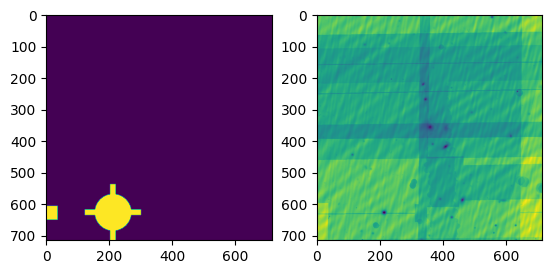

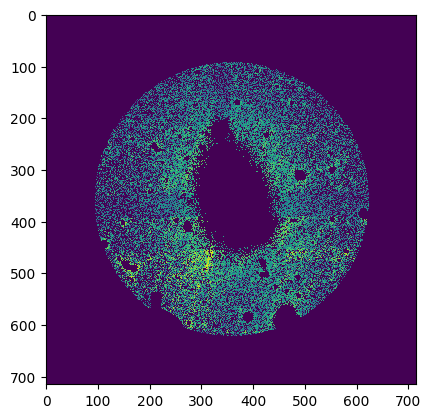

0.21107121522901098


In [12]:
measure_masked_weighted(18)

In [13]:
idxs = [18, 17, 14, 2317, 39, 45, 967, 73]
for i in idxs:
    measure_masked_weighted(i, plot=False)

0.21107121522901098
0.16541471624434756
0.16438249720057296
0.09214037291377421
0.15764534755606655
0.11859338727319242
0.08397900370190939
0.10315587024527313


## Checking the top and bottom ICL fraction images
For DUD catalogue only, using the method that was able to preserve the ranking order between studied ICL clusters in ```calc_icl_vs_literature.ipynb```

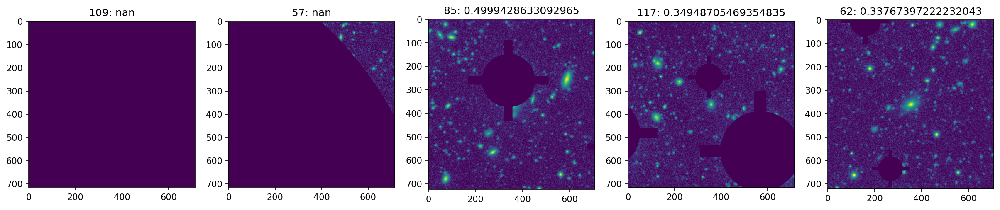

In [14]:
# Fracs precalculated
top_5_fracs = np.array([np.nan, np.nan, 0.4999428633092965, 0.34948705469354835, 0.33767397222232043])
top_5 = [109, 57, 85, 117, 62]

# Show the top 5
cutouts = h5py.File('../../cutouts_dud.hdf')

plt.figure(figsize=(20,4), dpi=150)
for i, idx in enumerate(top_5):
    plt.subplot(1, 5, i+1)
    mask = np.array(cutouts[str(idx)]['HDU1']['DATA']).astype(int)
    bad_mask = (mask & (1 | 512)).astype(bool)
    plt.imshow(stretch(cutouts[str(idx)]['HDU0']['DATA']) * ~bad_mask)
    plt.title(f'{idx}: {top_5_fracs[i]}')
plt.show()

Nans are because there is a bright object mask that completely covers the relevant parts of the image. The top frac with an actual number is also not good because the bright object mask almost fully covers the BCG. 

In [15]:
def measure_icl(cutout_idx, plot=True):
    cutout = cutouts[str(cutout_idx)]
    mask_data = np.array(cutout['HDU1']['DATA']).astype(int)
    BAD = 1
    BRIGHT_OBJECT = 512
    bad_mask = (mask_data & (BAD | BRIGHT_OBJECT)).astype(bool)
    weightings = 1/np.array(cutout['HDU2']['DATA'])

    if plot:
        plt.subplot(121)
        plt.imshow(mask_data & (BAD | BRIGHT_OBJECT))
        plt.subplot(122)
        plt.imshow(weightings)
        plt.show()
    
    # Create image, subtract background and create circular mask
    img_data = np.array(cutout['HDU0']['DATA'])
    bkg = background_estimate(img_data, mask=bad_mask)
    circ_mask = create_circular_mask(zs[cutout_idx], img_data, cosmo)
    img = (img_data - bkg) * circ_mask

    # Convert image from counts to surface brightness, accounting for dimming
    np.seterr(invalid='ignore', divide='ignore')
    sb_img = counts2sb(img, zs[cutout_idx])
 
    # From Cristina's code, who cites Roman+20 for this formula
    _, _, stddev = sigma_clipped_stats(img_data - bkg, mask=bad_mask)
    sb_lim = -2.5 * np.log10(3*stddev/(0.168 * 10)) + 2.5 * np.log10(63095734448.0194)
    
    # Mask out the values below surface brightness limit
    sb_img[sb_img >= sb_lim] = np.nan

    # Mask above the surface brightness threshold
    mask = sb_img > 25

    # Convert the SB image back to counts
    counts_img = sb2counts(sb_img)

    cmap = cm.viridis
    cmap.set_bad(cmap(0))
    if plot:
        plt.imshow(stretch(counts_img) * mask * ~bad_mask * weightings, cmap=cmap, interpolation='none')
        plt.show()

    weighted_img = counts_img * ~bad_mask * weightings
    print(np.sum((weighted_img * mask)[~np.isnan(counts_img)]) / np.sum((weighted_img)[~np.isnan(counts_img)]))

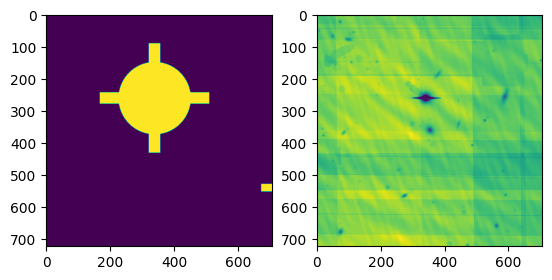

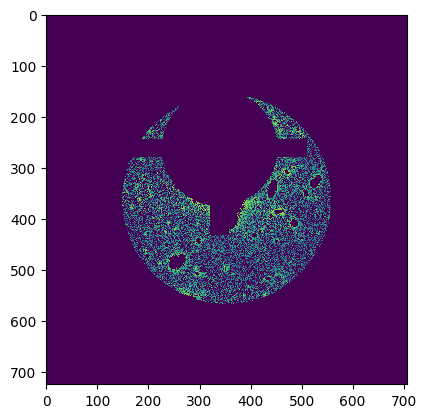

0.4998964685369405


In [16]:
measure_icl(85)

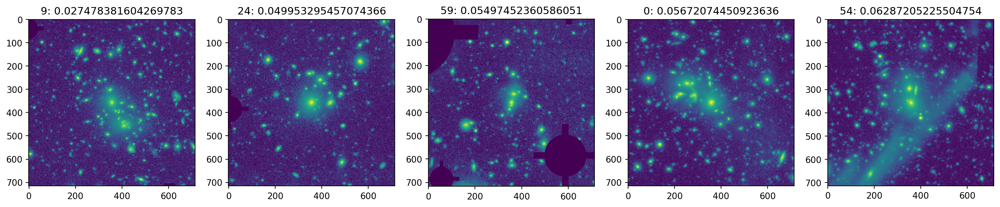

In [17]:
# Fracs precalculated
bottom_5_fracs = [0.027478381604269783, 0.049953295457074366, 0.05497452360586051, 0.05672074450923636, 0.06287205225504754]
bottom_5 = [9, 24, 59, 0, 54]

plt.figure(figsize=(20,4), dpi=150)
for i, idx in enumerate(bottom_5):
    plt.subplot(1, 5, i+1)
    mask = np.array(cutouts[str(idx)]['HDU1']['DATA']).astype(int)
    bad_mask = (mask & (1 | 512)).astype(bool)
    plt.imshow(stretch(cutouts[str(idx)]['HDU0']['DATA']) * ~bad_mask)
    plt.title(f'{idx}: {bottom_5_fracs[i]}')
plt.show()

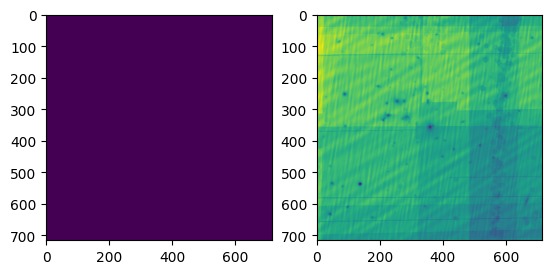

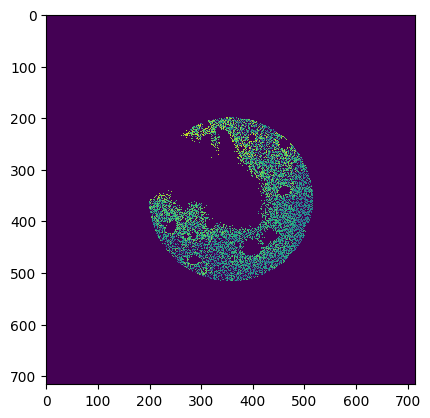

0.056715789943854664


In [18]:
measure_icl(0)

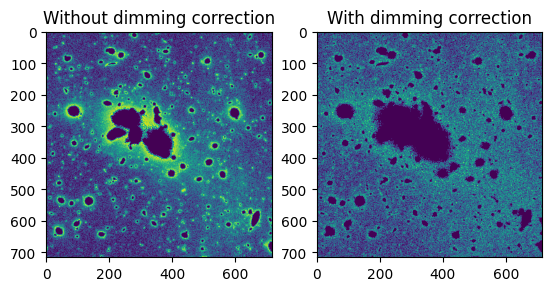

In [19]:
# Check this cluster
cutout = np.array(cutouts['0']['HDU0']['DATA'])
img = counts2sb(cutout, z=0)
img2 = counts2sb(cutout, z=zs[0])
mask = img > 25
mask2 = img2 > 25
plt.subplot(121) 
plt.imshow(stretch(cutout) * mask) 
plt.title('Without dimming correction')
plt.subplot(122) 
plt.imshow(stretch(cutout) * mask2)
plt.title('With dimming correction')
plt.show()

Check what the top and bottom clusters look like when also including those clusters from the WIDE survey. ~50 of the clusters register as nans, because of the problems with 

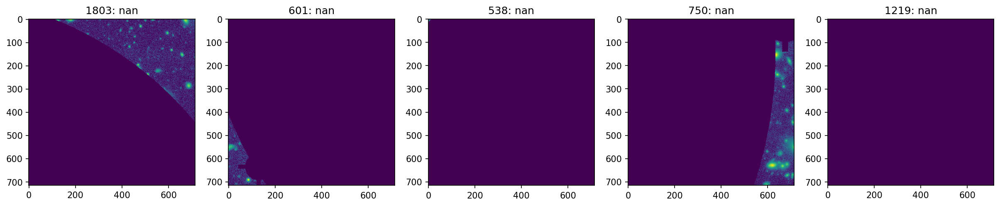

In [20]:
# Precalculated
top_5 = [1803, 601, 538, 750, 1219]
top_5_fracs = [np.nan, np.nan, np.nan, np.nan, np.nan]

# Show the top 5
cutouts = h5py.File('../../cutouts.hdf')

plt.figure(figsize=(20,4), dpi=150)
for i, idx in enumerate(top_5):
    plt.subplot(1, 5, i+1)
    mask = np.array(cutouts[str(idx)]['HDU1']['DATA']).astype(int)
    bad_mask = (mask & (1 | 512)).astype(bool)
    plt.imshow(stretch(cutouts[str(idx)]['HDU0']['DATA']) * ~bad_mask)
    plt.title(f'{idx}: {top_5_fracs[i]}')
plt.show()

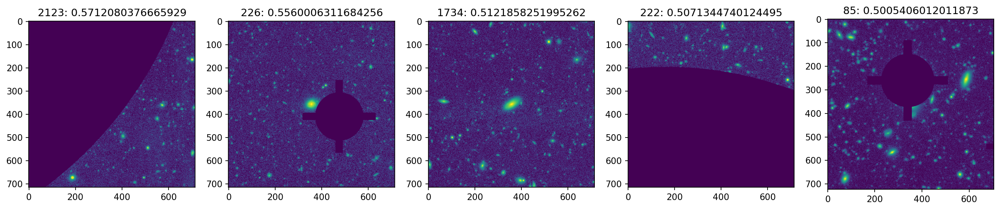

In [21]:
# Show the top 5 (not nans)
top_5_fracs = [0.5712080376665929, 0.5560006311684256, 0.5121858251995262, 0.5071344740124495, 0.5005406012011873]
top_5 = [2123, 226, 1734, 222, 85]

plt.figure(figsize=(20,4), dpi=150)
for i, idx in enumerate(top_5):
    plt.subplot(1, 5, i+1)
    mask = np.array(cutouts[str(idx)]['HDU1']['DATA']).astype(int)
    bad_mask = (mask & (1 | 512)).astype(bool)
    plt.imshow(stretch(cutouts[str(idx)]['HDU0']['DATA']) * ~bad_mask)
    plt.title(f'{idx}: {top_5_fracs[i]}')
plt.show()

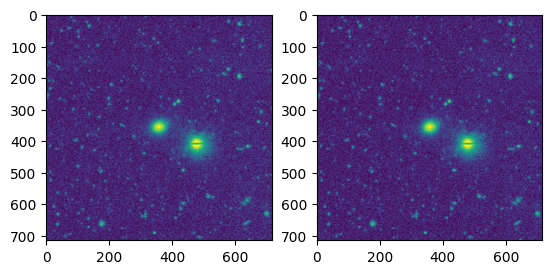

In [22]:
cutout = cutouts['226']['HDU0']['DATA']
plt.subplot(121)
plt.imshow(stretch(cutout))
bkg = background_estimate(cutout)
plt.subplot(122)
plt.imshow(stretch(cutout - bkg))
plt.show()

sb_img = counts2sb(cutout-bkg, z=0.1305)


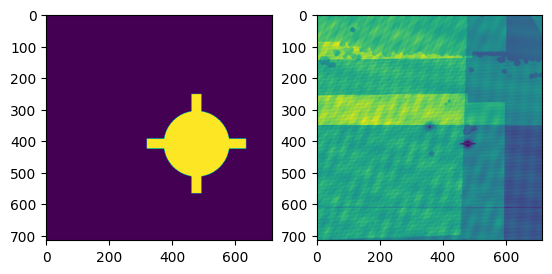

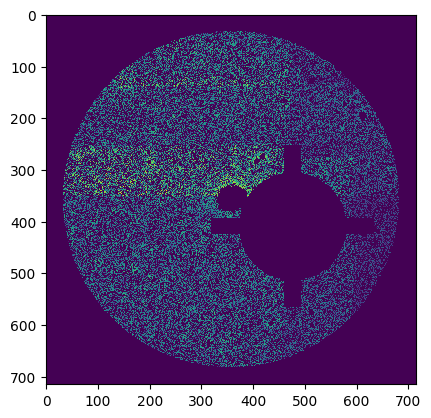

0.5559119316458715


In [23]:
measure_icl(226)

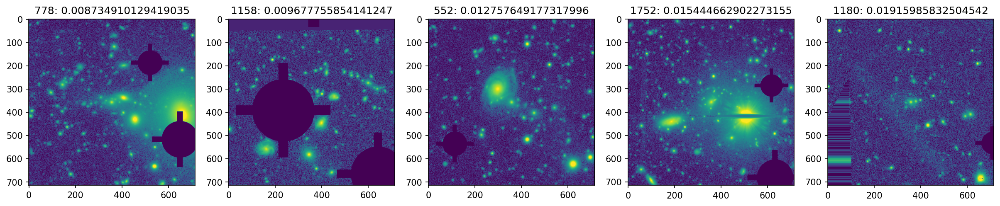

In [24]:
bottom_5_fracs = [0.008734910129419035, 0.009677755854141247, 0.012757649177317996, 0.015444662902273155, 0.01915985832504542]
bottom_5 = [778, 1158, 552, 1752, 1180]

# Show the bottom 5 clusters
plt.figure(figsize=(20,4), dpi=150)
for i, idx in enumerate(bottom_5):
    plt.subplot(1, 5, i+1)
    mask = np.array(cutouts[str(idx)]['HDU1']['DATA']).astype(int)
    bad_mask = (mask & (1 | 512)).astype(bool)
    plt.imshow(stretch(cutouts[str(idx)]['HDU0']['DATA']) * ~bad_mask)
    plt.title(f'{idx}: {bottom_5_fracs[i]}')
plt.show()

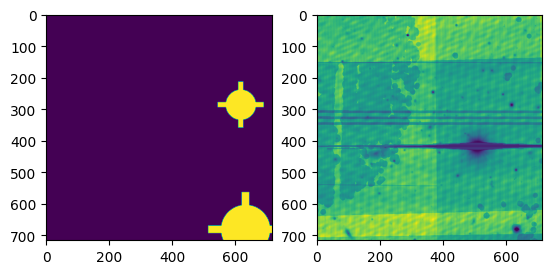

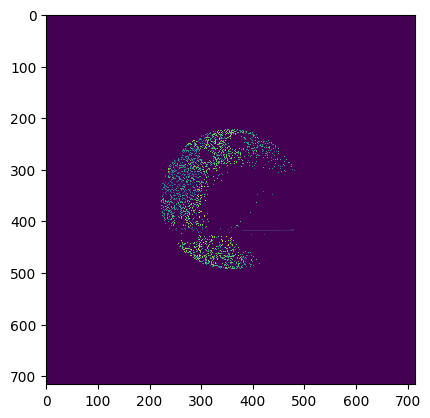

0.015542296188535268


In [25]:
measure_icl(1752)

In [26]:
# Throw out cutouts that have too much masked

# If the central 130kpc of the image is >30%(?) masked, or if the centre of the
# image is masked
count = 0
for key in cutouts.keys():
    mask_data = np.array(cutouts[key]['HDU1']['DATA'])
    bad_mask = (mask_data.astype(int) & (1 | 512)).astype(bool)
    
    circ_mask = create_circular_mask(z=zs[int(key)], img=mask_data, cosmo=cosmo)

    inner_frac_masked = np.sum(bad_mask * circ_mask) / np.sum(circ_mask)

    mid = (bad_mask.shape[0] // 2, bad_mask.shape[1] // 2)

    if inner_frac_masked > 0.3: # >30% of the inner region is masked
        count += 1
    elif bad_mask[mid]: # centre of the image is masked
        count += 1

print(f'{count} clusters excluded')


189 clusters excluded


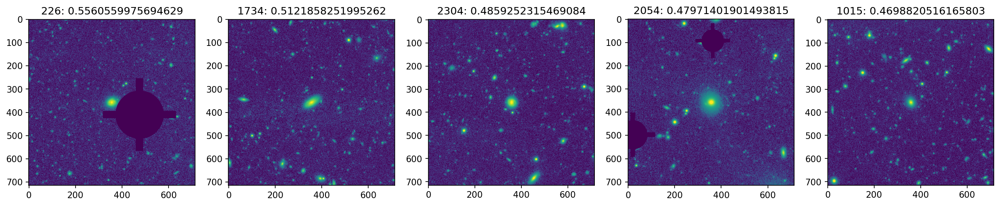

In [27]:
# Has been run with marking the clusters with too much masking as nans. 
# Bottom 5 are the same as previous since this only affects high frac cutouts
# Precalculated with measure_icl.py
top_5_fracs = [0.5560559975694629, 0.5121858251995262, 0.4859252315469084, 0.47971401901493815, 0.4698820516165803]
top_5 = [226, 1734, 2304, 2054, 1015]

# Show the top 5 (not nans)
plt.figure(figsize=(20,4), dpi=150)
for i, idx in enumerate(top_5):
    plt.subplot(1, 5, i+1)
    mask = np.array(cutouts[str(idx)]['HDU1']['DATA']).astype(int)
    bad_mask = (mask & (1 | 512)).astype(bool)
    plt.imshow(stretch(cutouts[str(idx)]['HDU0']['DATA']) * ~bad_mask)
    plt.title(f'{idx}: {top_5_fracs[i]}')
plt.show()

Not using weightings anymore, since those were confusing and not really providing any benefit.

In [28]:
# Messing with the original function to try and make it work better for my data
from photutils.segmentation import make_2dgaussian_kernel
from astropy.convolution import convolve
from matplotlib import cm

def measure_icl_test(cutout_idx, plot=True):
    cutout = cutouts[str(cutout_idx)]
    mask_data = np.array(cutout['HDU1']['DATA']).astype(int)
    BAD = 1
    BRIGHT_OBJECT = 512
    bad_mask = (mask_data & (BAD | BRIGHT_OBJECT)).astype(bool)
    
    # Create image, subtract background and create circular mask
    img_data = np.array(cutout['HDU0']['DATA'])
    bkg = background_estimate(img_data, mask=bad_mask)

    circ_mask = create_circular_mask(zs[cutout_idx], img_data, cosmo)
    img = img_data - bkg

    # Convert image from counts to surface brightness, accounting for dimming
    np.seterr(invalid='ignore', divide='ignore')
    sb_img = counts2sb(img, zs[cutout_idx])

    # Surface brightness limit calculation
    bkg_p = Background2D(img_data, (50,50))
    mesh = bkg_p.background_rms_mesh

    # Extract just the edges of the mesh
    size_x = mesh.shape[0]
    size_y = mesh.shape[1]
    xvals = np.arange(0, size_x)
    yvals = np.arange(0, size_y)

    box_size = 50
    box_cen = (box_size - 1) / 2.0

    top = np.column_stack((xvals, (size_x - 1) * np.ones(size_x, dtype=int)))
    bottom = np.column_stack((xvals, np.zeros(size_x, dtype=int)))
    left = np.column_stack((np.zeros(size_y, dtype=int), yvals))
    right = np.column_stack(((size_y - 1) * np.ones(size_y, dtype=int), yvals))

    # Indices of edges
    square = np.unique(np.concatenate((top, bottom, left, right), axis=0), axis=0)
    vals = np.array([mesh[tuple(c)] for c in square])
    stddev = np.median(vals)
 
    # From Cristina's code, who cites Roman+20 for this formula
    sb_lim = -2.5 * np.log10(3*stddev/(0.168 * 10)) + 2.5 * np.log10(63095734448.0194)
    
    # Mask out the values below surface brightness limit
    sb_img[sb_img >= sb_lim] = np.nan
    
    # Mask above the surface brightness threshold
    mask = sb_img > 25

    # Convert the SB image back to counts
    counts_img = sb2counts(sb_img)

    # Apply circular mask
    counts_img = counts_img * circ_mask

    cmap = cm.viridis
    cmap.set_bad(cmap(0))
    if plot:
        plt.figure(figsize=(8,4), dpi=200)
        plt.subplot(121)
        plt.imshow(stretch(counts_img) * mask * ~bad_mask, cmap=cmap, vmin=0, vmax=stretch(sb2counts(25)), interpolation='none')
        plt.subplot(122)
        plt.imshow(stretch(counts_img) * ~bad_mask, cmap=cmap, interpolation='none')
        plt.show()

    masked_img = counts_img * ~bad_mask
    print(np.sum((masked_img * mask)[~np.isnan(counts_img)]) / np.sum((masked_img)[~np.isnan(counts_img)]))


In [29]:
idxs = [18, 17, 14, 2317, 39, 45, 967, 73]

for idx in idxs:
    measure_icl_test(idx, plot=False)

0.14413877504573683
0.14228124839874254
0.13404466230888268
0.05757567414091331
0.1274323578520439
0.08684243812990403
0.0714270102882046
0.08754271989764792


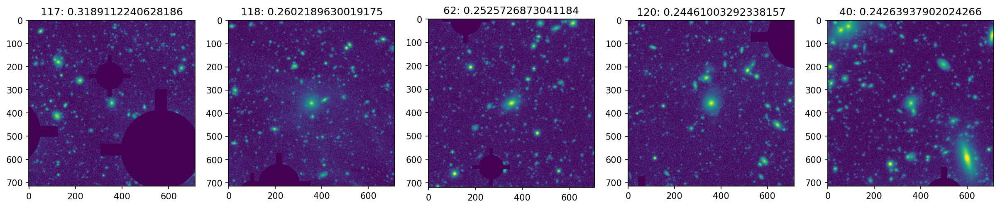

In [30]:
fracs = np.load('../../fracs.npy')

ranked = np.argsort(fracs)
mask = ~np.isnan(fracs[ranked])
top_5 = ranked[mask][-5:][::-1]
top_5_fracs = fracs[top_5]

plt.figure(figsize=(20,4), dpi=150)
for i, idx in enumerate(top_5):
    plt.subplot(1, 5, i+1)
    mask = (np.array(cutouts[str(idx)]['HDU1']['DATA']).astype(int) & (1 | 512)).astype(bool)
    plt.imshow(stretch(cutouts[str(idx)]['HDU0']['DATA']) * ~mask)  
    plt.title(f'{idx}: {top_5_fracs[i]}')
plt.show()

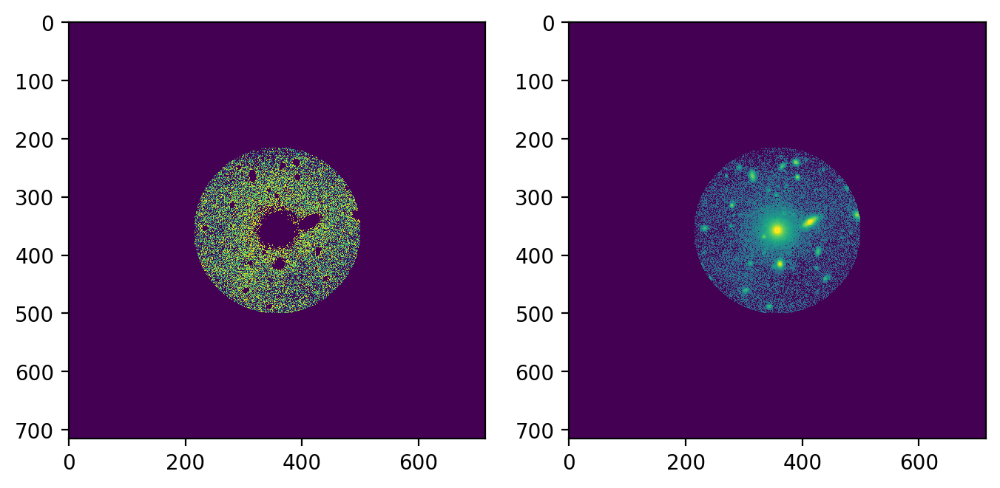

0.26020917279886885


In [31]:
measure_icl_test(118)

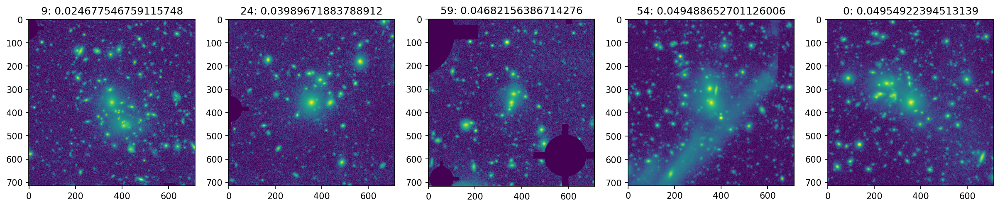

In [32]:
bottom_5 = ranked[:5]
bottom_5_fracs = fracs[bottom_5]

plt.figure(figsize=(20,4), dpi=150)
for i, idx in enumerate(bottom_5):
    plt.subplot(1, 5, i+1)
    mask = (np.array(cutouts[str(idx)]['HDU1']['DATA']).astype(int) & (1 | 512)).astype(bool)
    plt.imshow(stretch(cutouts[str(idx)]['HDU0']['DATA']) * ~mask)  
    plt.title(f'{idx}: {bottom_5_fracs[i]}')
plt.show()

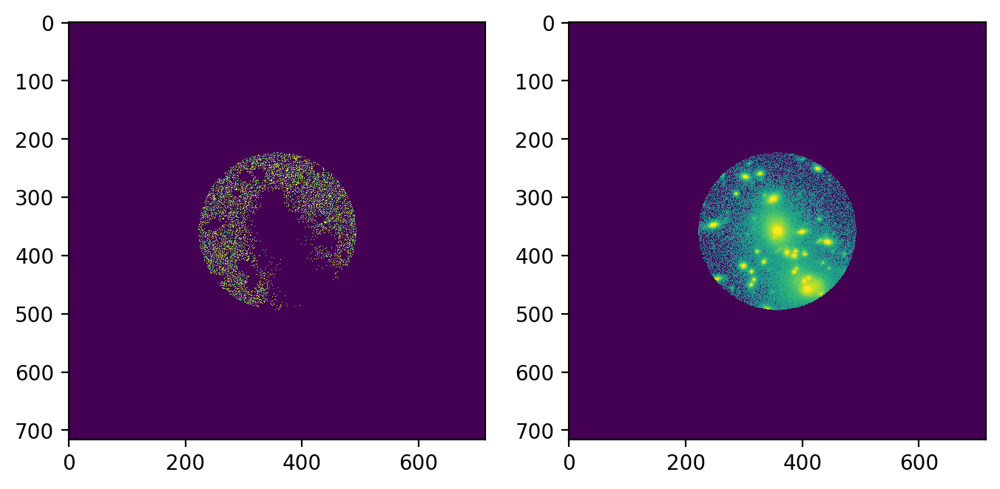

0.024674799391258856


In [33]:
measure_icl_test(9)

## Look into the surface brightness limit calculation 

In [34]:
cutout_idx = 18

cutout = cutouts[str(cutout_idx)]
mask_data = np.array(cutout['HDU1']['DATA']).astype(int)
BAD = 1
BRIGHT_OBJECT = 512
bad_mask = (mask_data & (BAD | BRIGHT_OBJECT)).astype(bool)

# Create image, subtract background and create circular mask
img_data = np.array(cutout['HDU0']['DATA'])
bkg = background_estimate(img_data, mask=bad_mask)

circ_mask = create_circular_mask(zs[cutout_idx], img_data, cosmo)
img = img_data - bkg

# Convert image from counts to surface brightness, accounting for dimming
np.seterr(invalid='ignore', divide='ignore')
sb_img = counts2sb(img, zs[cutout_idx])

# From Cristina's code, who cites Roman+20 for this formula
_, _, stddev = sigma_clipped_stats(img_data, mask=bad_mask)
sb_lim = -2.5 * np.log10(3*stddev/(0.168 * 10)) + 2.5 * np.log10(63095734448.0194)


bkg_p = Background2D(img_data, (50,50))
mesh = bkg_p.background_rms_mesh

# Extract just the edges of the mesh
size_x = mesh.shape[0]
size_y = mesh.shape[1]
xvals = np.arange(0, size_x)
yvals = np.arange(0, size_y)

box_size = 50
box_cen = (box_size - 1) / 2.0

top = np.column_stack((xvals, (size_x - 1) * np.ones(size_x, dtype=int)))
bottom = np.column_stack((xvals, np.zeros(size_x, dtype=int)))
left = np.column_stack((np.zeros(size_y, dtype=int), yvals))
right = np.column_stack(((size_y - 1) * np.ones(size_y, dtype=int), yvals))

# Indices of edges
square = np.unique(np.concatenate((top, bottom, left, right), axis=0), axis=0)
vals = np.array([mesh[tuple(c)] for c in square])
print(np.median(vals))

print(bkg_p.background_rms_median)

sb_lim_old = -2.5 * np.log10(3*stddev/(0.168 * 10)) + 2.5 * np.log10(63095734448.0194)
sb_lim = -2.5 * np.log10(3*np.median(vals)/(0.168 * 10)) + 2.5 * np.log10(63095734448.0194)

print(stddev)
print(sb_lim_old)
print(sb_lim)
    

0.03725716828327752
0.03856488214503667
0.045555547
29.724116906086557
29.942445458941087


## Find the flux at different apertures from the centre of the BCG and find where the profile is flat

[0.7160479209010717, 0.11294509733216096, 0.036299101776753766, 0.0166474396749561, 0.010005960351711161, 0.007908282130804585, 0.006336143040316195, 0.00501567574617725, 0.004352534805183814, 0.003670837459392724, 0.0029818687824675885, 0.002694156841444112, 0.0025426928753957277, 0.0023198241409854822, 0.002089943482136589, 0.002059167113493943, 0.0019610419728963648, 0.0019185113618025234]


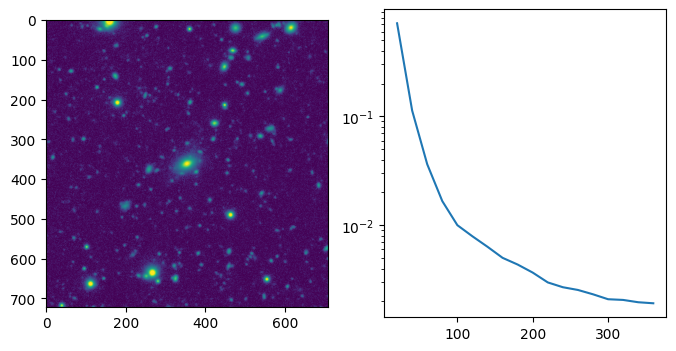

In [51]:
from photutils.aperture import CircularAnnulus
from astropy.stats import sigma_clipped_stats

cutout_idx = 62

cutout = cutouts[str(cutout_idx)]
img_data = np.array(cutouts[str(cutout_idx)]['HDU0']['DATA'])
mask_data = np.array(cutouts[str(cutout_idx)]['HDU1']['DATA']).astype(int)
bad_mask = (mask_data & (1 | 512)).astype(bool)

# Subtract the background from the image
bkg = background_estimate(img_data)
img = img_data - bkg

# Define the apertures
medians = []
centre = (img.shape[0] // 2, img.shape[1] // 2)
r_in = 0.1
r_out = 10

while r_out < np.min(centre):
    # Create the circular aperture
    aperture = CircularAnnulus(centre, r_in=r_in, r_out=r_out)
    mask = aperture.to_mask()

    # Get the image and mask data inside this annulus
    annulus = mask.cutout(img, fill_value=np.nan)
    mask_cutout = mask.cutout(bad_mask, fill_value=False)

    # Calculate the sigma clipped median of values in the annulus
    _, median, _ = sigma_clipped_stats(annulus, mask=mask_cutout)
    medians.append(median)

    # Update the radii
    r_in += 20
    r_out += 20

print(medians)
plt.figure(figsize=(8,4))
plt.subplot(121)
plt.imshow(stretch(img))
plt.subplot(122)
plt.plot(np.arange(20, r_out, step=20), medians)
plt.yscale('log')
plt.show()